## KNN implementation on 220 Band AVIRIS Hyperspectral Image of Indian Pine Test Site 3 
## --> PCA (Raw) without standardization
## --> KNN Library Code
## --> k = best value of k for maximum frequency

# Principal Component Analysis on 220 Band AVIRIS Hyperspectral Image of Indian Pine Test Site 3 
## -> .lan file
## -> without standardization

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline

## Reading .lan file

In [2]:
#import the package
from spectral import *

In [3]:
data = open_image('D:\Academic Thesis Papers\Thesis Report 5\sample-data-master\92AV3C.lan')

In [4]:
data

	Data Source:   'D:\Academic Thesis Papers\Thesis Report 5\sample-data-master\92AV3C.lan'
	# Rows:            145
	# Samples:         145
	# Bands:           220
	Interleave:        BIL
	Quantization:  16 bits
	Data format:     int16

In [5]:
data.shape

(145, 145, 220)

In [6]:
data[:,:,:]

array([[[3172, 4142, 4506, ..., 1020, 1020, 1005],
        [3348, 4266, 4502, ..., 1029, 1020, 1000],
        [3687, 4266, 4421, ..., 1030, 1016, 1009],
        ...,
        [3341, 3890, 4320, ..., 1021, 1015, 1025],
        [3170, 4130, 4320, ..., 1024, 1020, 1011],
        [3172, 3890, 4316, ..., 1034, 1016, 1015]],

       [[3344, 4388, 4334, ..., 1030, 1006, 1015],
        [3515, 4264, 4592, ..., 1039, 1015, 1020],
        [3518, 4268, 4423, ..., 1026, 1015, 1020],
        ...,
        [3859, 4512, 4605, ..., 1035, 1015,  996],
        [3686, 4264, 4690, ..., 1012, 1020, 1014],
        [3512, 4268, 4597, ..., 1019, 1016, 1010]],

       [[3512, 4146, 4416, ..., 1029, 1025, 1010],
        [3344, 4389, 4416, ..., 1021, 1011, 1000],
        [3512, 4273, 4420, ..., 1033, 1010, 1014],
        ...,
        [3341, 4266, 4509, ..., 1025, 1010, 1005],
        [3344, 4262, 4496, ..., 1029, 1020, 1005],
        [3510, 4142, 4230, ..., 1025, 1011, 1010]],

       ...,

       [[3324, 3728, 400

In [7]:
# data[0] won't work here
data[0,:,:]

array([[[3172, 4142, 4506, ..., 1020, 1020, 1005],
        [3348, 4266, 4502, ..., 1029, 1020, 1000],
        [3687, 4266, 4421, ..., 1030, 1016, 1009],
        ...,
        [3341, 3890, 4320, ..., 1021, 1015, 1025],
        [3170, 4130, 4320, ..., 1024, 1020, 1011],
        [3172, 3890, 4316, ..., 1034, 1016, 1015]]], dtype=int16)

In [8]:
data[0,0,:]

array([[[3172, 4142, 4506, 4279, 4782, 5048, 5213, 5106, 5053, 4750,
         4816, 4769, 4610, 4805, 4828, 4861, 4767, 4624, 4549, 4463,
         4462, 4446, 4445, 4336, 4381, 4319, 4207, 4305, 4311, 3991,
         4168, 3942, 4061, 4365, 4318, 4252, 4869, 5284, 5055, 3591,
         5175, 5217, 5058, 4969, 4721, 4291, 4555, 4886, 4868, 4806,
         4783, 4811, 4709, 3903, 3795, 3715, 3359, 2130, 2269, 2480,
         3145, 3626, 4060, 4296, 4211, 4225, 4157, 4133, 4082, 4048,
         3935, 3843, 3784, 3642, 3271, 2707, 1707, 1564, 1838, 1719,
         2229, 2764, 2919, 2873, 2977, 2913, 3034, 3051, 3124, 3101,
         3033, 2713, 2740, 2947, 2706, 2834, 2856, 2683, 2400, 2229,
         1822, 1542, 1097, 1029, 1020, 1026, 1009, 1011, 1047, 1069,
         1100, 1122, 1259, 1365, 1261, 1374, 1630, 1851, 2028, 2130,
         2170, 2205, 2214, 2204, 2100, 2106, 2146, 2089, 2078, 2134,
         2127, 2074, 2057, 2045, 2003, 1999, 1959, 1924, 1883, 1843,
         1781, 1716, 1698, 1645, 1

In [9]:
# (0,0) pixel value of band 0
data[0,0,0]

3172

In [10]:
# (0,0) pixel value of band 1
data[0,0,1]

4142

In [11]:
# (0,0) pixel value of band 219
data[0,0,219]

1005

In [12]:
ground_truth = open_image('D:\Academic Thesis Papers\Thesis Report 5\sample-data-master\92AV3GT.GIS').read_band(0)

In [13]:
ground_truth

array([[3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int8)

In [14]:
ground_truth_data = ground_truth
ground_truth_data

array([[3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int8)

## Preparing Data by making the band number as features and pixel number as rows

In [15]:
dictionary = dict()
value = list()

for z in range(220):
    count = z + 1
    key = 'band_' + str(count)
    
    for x in range(145):
        for y in range(145):
            value.append(data[x,y,z])
    
    dictionary[key] = value
    value = list()
            
dictionary

{'band_1': [3172,
  3348,
  3687,
  3517,
  3514,
  3343,
  3343,
  3343,
  3346,
  3522,
  3858,
  3514,
  3343,
  3343,
  3343,
  3343,
  3343,
  3343,
  3346,
  3514,
  3341,
  3172,
  3343,
  3341,
  3167,
  3004,
  3514,
  3341,
  3170,
  3170,
  3170,
  3167,
  3002,
  3338,
  2996,
  3004,
  3514,
  3343,
  3346,
  3517,
  3517,
  3514,
  3348,
  3687,
  3514,
  3346,
  3514,
  3343,
  3346,
  3514,
  3343,
  3343,
  3343,
  3348,
  3687,
  3511,
  3172,
  3346,
  3514,
  3346,
  3519,
  3690,
  3690,
  3690,
  3693,
  3858,
  3517,
  3517,
  3511,
  3170,
  3175,
  3514,
  3343,
  3343,
  3341,
  3172,
  3341,
  3167,
  2999,
  3170,
  3162,
  2657,
  3170,
  3167,
  3002,
  3341,
  3172,
  3338,
  2999,
  3170,
  3167,
  2996,
  2999,
  3167,
  3002,
  3341,
  3178,
  3690,
  3687,
  3517,
  3517,
  3514,
  3343,
  3346,
  3511,
  3175,
  3514,
  3343,
  3343,
  3343,
  3341,
  3172,
  3343,
  3346,
  3511,
  3172,
  3341,
  3170,
  3178,
  3685,
  3343,
  3341,
  3175,
  3517

In [16]:
dictionary['band_1']

[3172,
 3348,
 3687,
 3517,
 3514,
 3343,
 3343,
 3343,
 3346,
 3522,
 3858,
 3514,
 3343,
 3343,
 3343,
 3343,
 3343,
 3343,
 3346,
 3514,
 3341,
 3172,
 3343,
 3341,
 3167,
 3004,
 3514,
 3341,
 3170,
 3170,
 3170,
 3167,
 3002,
 3338,
 2996,
 3004,
 3514,
 3343,
 3346,
 3517,
 3517,
 3514,
 3348,
 3687,
 3514,
 3346,
 3514,
 3343,
 3346,
 3514,
 3343,
 3343,
 3343,
 3348,
 3687,
 3511,
 3172,
 3346,
 3514,
 3346,
 3519,
 3690,
 3690,
 3690,
 3693,
 3858,
 3517,
 3517,
 3511,
 3170,
 3175,
 3514,
 3343,
 3343,
 3341,
 3172,
 3341,
 3167,
 2999,
 3170,
 3162,
 2657,
 3170,
 3167,
 3002,
 3341,
 3172,
 3338,
 2999,
 3170,
 3167,
 2996,
 2999,
 3167,
 3002,
 3341,
 3178,
 3690,
 3687,
 3517,
 3517,
 3514,
 3343,
 3346,
 3511,
 3175,
 3514,
 3343,
 3343,
 3343,
 3341,
 3172,
 3343,
 3346,
 3511,
 3172,
 3341,
 3170,
 3178,
 3685,
 3343,
 3341,
 3175,
 3517,
 3517,
 3517,
 3517,
 3519,
 3690,
 3693,
 3858,
 3519,
 3687,
 3522,
 3861,
 3687,
 3517,
 3514,
 3346,
 3514,
 3338,
 3002,
 3341,

In [17]:
np.array(dictionary['band_1'])

array([3172, 3348, 3687, ..., 3153, 3155, 3323], dtype=int16)

In [18]:
np.array(dictionary['band_1']).shape

(21025,)

In [19]:
np.array(dictionary['band_1']).reshape(145,145)

array([[3172, 3348, 3687, ..., 3341, 3170, 3172],
       [3344, 3515, 3518, ..., 3859, 3686, 3512],
       [3512, 3344, 3512, ..., 3341, 3344, 3510],
       ...,
       [3324, 2983, 2988, ..., 3332, 3498, 3156],
       [3161, 3495, 2988, ..., 3156, 3159, 3329],
       [2979, 2977, 2814, ..., 3153, 3155, 3323]], dtype=int16)

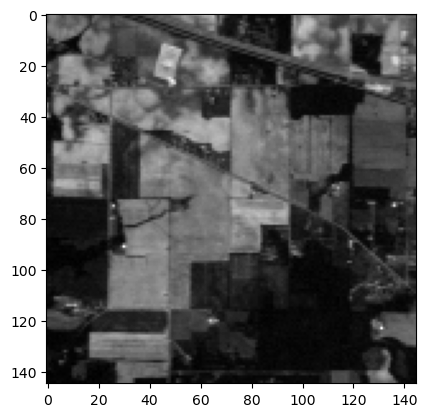

In [20]:
plt.imshow(np.array(dictionary['band_32']).reshape(145,145),cmap='gray')
plt.show()

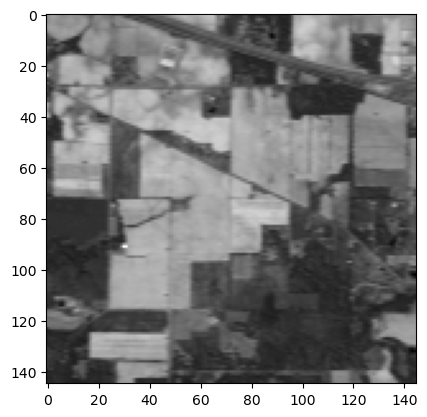

In [21]:
plt.imshow(np.array(dictionary['band_122']).reshape(145,145),cmap='gray')
plt.show()

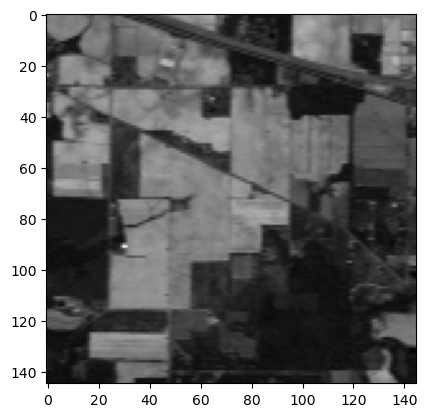

In [22]:
plt.imshow(np.array(dictionary['band_183']).reshape(145,145),cmap='gray')
plt.show()

## Preparing ground truth data as target data

In [23]:
ground_truth_data

array([[3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int8)

In [24]:
ground_truth_data.shape

(145, 145)

In [25]:
# number of unique values and their count

diff = dict()

for i in range(145):
    for j in range(145):
        if ground_truth_data[i,j] not in diff:
            diff[ground_truth_data[i,j]] = 1
        else:
            diff[ground_truth_data[i,j]] = diff[ground_truth_data[i,j]] + 1
diff

{3: 834,
 0: 10659,
 15: 380,
 11: 2468,
 12: 614,
 5: 497,
 10: 968,
 14: 1294,
 16: 95,
 2: 1434,
 4: 234,
 8: 489,
 6: 747,
 9: 20,
 1: 54,
 7: 26,
 13: 212}

So there are total 17 classes in this ground truth data

In [26]:
ground_truth_data.reshape(21025,1)

array([[3],
       [3],
       [3],
       ...,
       [0],
       [0],
       [0]], dtype=int8)

In [27]:
target = ground_truth_data.reshape(21025,1)
target

array([[3],
       [3],
       [3],
       ...,
       [0],
       [0],
       [0]], dtype=int8)

In [28]:
print(target.shape)
print(target.ndim)

(21025, 1)
2


but still, 'target' remains as 2D since it's shape is (21025,1). So we need 'target' to be 1D

In [29]:
target = ground_truth_data.reshape(21025,)
target

array([3, 3, 3, ..., 0, 0, 0], dtype=int8)

In [30]:
print(target.shape)
print(target.ndim)

(21025,)
1


# Step by step Principal Component Analysis

## 1. Standardization of Data

In [31]:
original_data = pd.DataFrame(dictionary)

original_data

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
0,3172,4142,4506,4279,4782,5048,5213,5106,5053,4750,...,1094,1090,1112,1090,1062,1069,1057,1020,1020,1005
1,3348,4266,4502,4426,4853,5249,5352,5353,5347,5065,...,1108,1104,1117,1091,1079,1085,1064,1029,1020,1000
2,3687,4266,4421,4498,5019,5293,5438,5427,5383,5132,...,1111,1114,1114,1100,1065,1092,1061,1030,1016,1009
3,3517,4258,4603,4493,4958,5234,5417,5355,5349,5096,...,1122,1108,1109,1109,1071,1088,1060,1030,1006,1005
4,3514,4018,4675,4417,4886,5117,5215,5096,5098,4834,...,1110,1107,1112,1094,1072,1087,1052,1034,1019,1019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,3329,3987,4011,4023,4201,4377,4418,4248,4180,3838,...,1013,1012,1018,1015,1011,1001,1000,1009,1008,1009
21021,3494,4104,4024,3880,4210,4377,4413,4174,4229,3900,...,1012,1014,1012,1024,998,1010,1006,1000,1000,1004
21022,3153,3864,4282,3889,4310,4372,4375,4208,4096,3878,...,1016,1015,1016,1021,1008,1019,1003,1008,1000,1009
21023,3155,4104,4109,4027,4139,4318,4413,4174,4140,3933,...,1005,1011,1008,1012,1014,1007,1011,1005,1003,1004


In [32]:
original_data.describe().loc[['mean','std']]

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
mean,3341.313103,4091.957765,4277.523662,4170.075672,4516.685375,4790.607134,4848.334269,4714.739073,4668.916528,4439.259453,...,1061.958240,1060.238383,1063.299215,1050.072913,1040.227539,1043.391011,1030.223496,1015.600856,1008.513864,1006.791011
std,212.254014,227.885060,257.819760,280.381316,346.041777,414.386445,469.244664,491.731609,533.233484,539.486030,...,38.823109,38.694237,41.906116,34.232348,26.447967,29.788944,20.872378,11.437696,7.052013,6.995153


In [33]:
# just counting if any mean or std of any band or feature is 0

# count = 0
# for i in original_data.describe().loc[['mean','std']].loc['mean']:
#     if i ==0 :
#         count = count + 1
# print(count)

# count = 0
# for i in original_data.describe().loc[['mean','std']].loc['std']:
#     if i ==0 :
#         count = count + 1
# print(count)

In [34]:
# standardizing the data

# l = list()
# data = dict()
# count = 0

# for i in original_data.columns:
#     mean = original_data[i].mean()
#     std = original_data[i].std()

#     for x in original_data[i]:
#         z = (x - mean) / std
#         l.append(z)

#     data[i] = l
#     l = list()

# data

In [35]:
standardized_data = original_data

standardized_data

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
0,3172,4142,4506,4279,4782,5048,5213,5106,5053,4750,...,1094,1090,1112,1090,1062,1069,1057,1020,1020,1005
1,3348,4266,4502,4426,4853,5249,5352,5353,5347,5065,...,1108,1104,1117,1091,1079,1085,1064,1029,1020,1000
2,3687,4266,4421,4498,5019,5293,5438,5427,5383,5132,...,1111,1114,1114,1100,1065,1092,1061,1030,1016,1009
3,3517,4258,4603,4493,4958,5234,5417,5355,5349,5096,...,1122,1108,1109,1109,1071,1088,1060,1030,1006,1005
4,3514,4018,4675,4417,4886,5117,5215,5096,5098,4834,...,1110,1107,1112,1094,1072,1087,1052,1034,1019,1019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,3329,3987,4011,4023,4201,4377,4418,4248,4180,3838,...,1013,1012,1018,1015,1011,1001,1000,1009,1008,1009
21021,3494,4104,4024,3880,4210,4377,4413,4174,4229,3900,...,1012,1014,1012,1024,998,1010,1006,1000,1000,1004
21022,3153,3864,4282,3889,4310,4372,4375,4208,4096,3878,...,1016,1015,1016,1021,1008,1019,1003,1008,1000,1009
21023,3155,4104,4109,4027,4139,4318,4413,4174,4140,3933,...,1005,1011,1008,1012,1014,1007,1011,1005,1003,1004


In [36]:
standardized_data.describe().loc[['mean','std']]

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
mean,3341.313103,4091.957765,4277.523662,4170.075672,4516.685375,4790.607134,4848.334269,4714.739073,4668.916528,4439.259453,...,1061.958240,1060.238383,1063.299215,1050.072913,1040.227539,1043.391011,1030.223496,1015.600856,1008.513864,1006.791011
std,212.254014,227.885060,257.819760,280.381316,346.041777,414.386445,469.244664,491.731609,533.233484,539.486030,...,38.823109,38.694237,41.906116,34.232348,26.447967,29.788944,20.872378,11.437696,7.052013,6.995153


## 2. Calculate the covariance matrix

In [37]:
standardized_data.cov()

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
band_1,45051.766640,27232.362968,33763.924835,36932.863720,45221.053852,53798.198641,60666.020667,63213.466785,68297.442090,68804.090802,...,4267.194916,4226.484576,4590.565129,3742.752046,2859.668765,3224.442541,2232.630076,1101.399808,482.621729,444.474780
band_2,27232.362968,51931.600766,47488.852978,53356.484741,66274.344112,79535.137088,89863.347595,93832.613028,101310.457709,102257.342009,...,6397.226499,6359.509070,6891.944811,5622.840218,4288.580339,4867.807992,3356.940756,1666.385729,689.916729,643.843056
band_3,33763.924835,47488.852978,66471.028562,65537.202381,82603.468561,98941.431623,112056.324900,117203.097832,126827.752427,128018.006679,...,8096.960320,8035.777845,8731.756975,7114.051666,5416.480489,6146.702957,4233.898179,2094.421736,855.298295,786.280583
band_4,36932.863720,53356.484741,65537.202381,78613.682297,92374.443901,111371.055273,126016.478985,131954.383711,142927.171461,144387.220520,...,9199.846292,9130.974017,9916.291950,8080.613584,6154.852977,6974.287619,4808.895663,2361.780538,954.358231,881.195420
band_5,45221.053852,66274.344112,82603.468561,92374.443901,119744.911233,140431.972327,159519.203396,166981.676606,181006.598594,182956.244829,...,11735.994186,11657.765073,12651.122113,10304.836060,7852.842759,8901.135490,6128.585494,3009.975441,1195.547908,1110.384205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
band_216,3224.442541,4867.807992,6146.702957,6974.287619,8901.135490,10780.266683,12341.794377,13013.073444,14200.457345,14427.230976,...,1125.817224,1120.954445,1216.328679,989.569615,758.789213,887.381207,590.506832,290.751825,114.733282,107.297141
band_217,2232.630076,3356.940756,4233.898179,4808.895663,6128.585494,7414.656634,8496.262142,8948.691120,9768.699022,9921.822956,...,774.319408,770.830377,836.435692,680.363127,522.275152,590.506832,435.656145,200.832219,79.481704,74.257137
band_218,1101.399808,1666.385729,2094.421736,2361.780538,3009.975441,3637.132043,4166.785730,4390.556854,4789.030703,4862.459395,...,380.097296,378.348531,411.005518,334.781245,256.973911,290.751825,200.832219,130.820890,40.349807,37.774599
band_219,482.621729,689.916729,855.298295,954.358231,1195.547908,1441.125025,1644.215637,1729.947159,1886.696957,1910.067678,...,149.680706,149.180723,161.672816,131.723471,101.262304,114.733282,79.481704,40.349807,49.730889,16.238010


## 3. Calculate eigenvalues and eigenvectors

In [38]:
from numpy.linalg import eig

In [39]:
a = standardized_data.cov()
a

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
band_1,45051.766640,27232.362968,33763.924835,36932.863720,45221.053852,53798.198641,60666.020667,63213.466785,68297.442090,68804.090802,...,4267.194916,4226.484576,4590.565129,3742.752046,2859.668765,3224.442541,2232.630076,1101.399808,482.621729,444.474780
band_2,27232.362968,51931.600766,47488.852978,53356.484741,66274.344112,79535.137088,89863.347595,93832.613028,101310.457709,102257.342009,...,6397.226499,6359.509070,6891.944811,5622.840218,4288.580339,4867.807992,3356.940756,1666.385729,689.916729,643.843056
band_3,33763.924835,47488.852978,66471.028562,65537.202381,82603.468561,98941.431623,112056.324900,117203.097832,126827.752427,128018.006679,...,8096.960320,8035.777845,8731.756975,7114.051666,5416.480489,6146.702957,4233.898179,2094.421736,855.298295,786.280583
band_4,36932.863720,53356.484741,65537.202381,78613.682297,92374.443901,111371.055273,126016.478985,131954.383711,142927.171461,144387.220520,...,9199.846292,9130.974017,9916.291950,8080.613584,6154.852977,6974.287619,4808.895663,2361.780538,954.358231,881.195420
band_5,45221.053852,66274.344112,82603.468561,92374.443901,119744.911233,140431.972327,159519.203396,166981.676606,181006.598594,182956.244829,...,11735.994186,11657.765073,12651.122113,10304.836060,7852.842759,8901.135490,6128.585494,3009.975441,1195.547908,1110.384205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
band_216,3224.442541,4867.807992,6146.702957,6974.287619,8901.135490,10780.266683,12341.794377,13013.073444,14200.457345,14427.230976,...,1125.817224,1120.954445,1216.328679,989.569615,758.789213,887.381207,590.506832,290.751825,114.733282,107.297141
band_217,2232.630076,3356.940756,4233.898179,4808.895663,6128.585494,7414.656634,8496.262142,8948.691120,9768.699022,9921.822956,...,774.319408,770.830377,836.435692,680.363127,522.275152,590.506832,435.656145,200.832219,79.481704,74.257137
band_218,1101.399808,1666.385729,2094.421736,2361.780538,3009.975441,3637.132043,4166.785730,4390.556854,4789.030703,4862.459395,...,380.097296,378.348531,411.005518,334.781245,256.973911,290.751825,200.832219,130.820890,40.349807,37.774599
band_219,482.621729,689.916729,855.298295,954.358231,1195.547908,1441.125025,1644.215637,1729.947159,1886.696957,1910.067678,...,149.680706,149.180723,161.672816,131.723471,101.262304,114.733282,79.481704,40.349807,49.730889,16.238010


In [40]:
w,v=eig(a)
print('eigenvalues :\n', w)
print()
print('eigenvectors :\n', v)

eigenvalues :
 [2.53831117e+07 8.62968752e+06 6.06428628e+05 1.28537965e+05
 6.92758263e+04 5.32714949e+04 2.59841921e+04 1.36179791e+04
 1.26709812e+04 8.33614260e+03 6.82474265e+03 5.83761562e+03
 5.05452300e+03 3.16513480e+03 3.03708048e+03 2.71647377e+03
 2.57527582e+03 2.26841037e+03 2.08525692e+03 1.86846180e+03
 1.78950652e+03 1.74172003e+03 1.59980822e+03 1.53870528e+03
 1.51353894e+03 1.47403376e+03 1.40502504e+03 1.37563633e+03
 1.34899397e+03 1.30399013e+03 1.25395464e+03 1.20584751e+03
 1.17716302e+03 1.16902367e+03 1.15794720e+03 1.12819618e+03
 1.11065049e+03 1.01555093e+03 9.76445180e+02 9.01021074e+02
 8.33398277e+02 8.40013150e+02 7.28467806e+02 7.10363147e+02
 6.67199409e+02 6.04896589e+02 5.86707908e+02 5.76194261e+02
 5.37137915e+02 4.96102884e+02 4.74655707e+02 4.67061975e+02
 4.35715525e+02 3.98360330e+02 3.90972495e+02 3.80143342e+02
 3.78568282e+02 3.71265819e+02 3.60573973e+02 3.53786593e+02
 3.37283918e+02 3.29396876e+02 3.25675559e+02 3.24135280e+02
 3.212692

## 4. Sort the eigenvector in descending order based on eigenvalues and form feature vector

In [41]:
a

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
band_1,45051.766640,27232.362968,33763.924835,36932.863720,45221.053852,53798.198641,60666.020667,63213.466785,68297.442090,68804.090802,...,4267.194916,4226.484576,4590.565129,3742.752046,2859.668765,3224.442541,2232.630076,1101.399808,482.621729,444.474780
band_2,27232.362968,51931.600766,47488.852978,53356.484741,66274.344112,79535.137088,89863.347595,93832.613028,101310.457709,102257.342009,...,6397.226499,6359.509070,6891.944811,5622.840218,4288.580339,4867.807992,3356.940756,1666.385729,689.916729,643.843056
band_3,33763.924835,47488.852978,66471.028562,65537.202381,82603.468561,98941.431623,112056.324900,117203.097832,126827.752427,128018.006679,...,8096.960320,8035.777845,8731.756975,7114.051666,5416.480489,6146.702957,4233.898179,2094.421736,855.298295,786.280583
band_4,36932.863720,53356.484741,65537.202381,78613.682297,92374.443901,111371.055273,126016.478985,131954.383711,142927.171461,144387.220520,...,9199.846292,9130.974017,9916.291950,8080.613584,6154.852977,6974.287619,4808.895663,2361.780538,954.358231,881.195420
band_5,45221.053852,66274.344112,82603.468561,92374.443901,119744.911233,140431.972327,159519.203396,166981.676606,181006.598594,182956.244829,...,11735.994186,11657.765073,12651.122113,10304.836060,7852.842759,8901.135490,6128.585494,3009.975441,1195.547908,1110.384205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
band_216,3224.442541,4867.807992,6146.702957,6974.287619,8901.135490,10780.266683,12341.794377,13013.073444,14200.457345,14427.230976,...,1125.817224,1120.954445,1216.328679,989.569615,758.789213,887.381207,590.506832,290.751825,114.733282,107.297141
band_217,2232.630076,3356.940756,4233.898179,4808.895663,6128.585494,7414.656634,8496.262142,8948.691120,9768.699022,9921.822956,...,774.319408,770.830377,836.435692,680.363127,522.275152,590.506832,435.656145,200.832219,79.481704,74.257137
band_218,1101.399808,1666.385729,2094.421736,2361.780538,3009.975441,3637.132043,4166.785730,4390.556854,4789.030703,4862.459395,...,380.097296,378.348531,411.005518,334.781245,256.973911,290.751825,200.832219,130.820890,40.349807,37.774599
band_219,482.621729,689.916729,855.298295,954.358231,1195.547908,1441.125025,1644.215637,1729.947159,1886.696957,1910.067678,...,149.680706,149.180723,161.672816,131.723471,101.262304,114.733282,79.481704,40.349807,49.730889,16.238010


In [42]:
a.shape 

(220, 220)

In [43]:
eigen_number = a.shape[0]
eigen_number

220

In [44]:
# grabbing the eigenectors from 'v'

l = list()

for i in range(eigen_number):
    s = v[:,i]
    s2 = s.reshape(eigen_number,1)
    l.append(s2)

l

[array([[ 2.19362865e-02],
        [ 3.37132361e-02],
        [ 4.24733499e-02],
        [ 4.83242117e-02],
        [ 6.16310824e-02],
        [ 7.45813394e-02],
        [ 8.50867798e-02],
        [ 8.95987680e-02],
        [ 9.76740374e-02],
        [ 9.89839507e-02],
        [ 1.06991984e-01],
        [ 1.10805634e-01],
        [ 1.07316689e-01],
        [ 1.08150422e-01],
        [ 1.09181237e-01],
        [ 1.11879690e-01],
        [ 1.14990836e-01],
        [ 1.22760240e-01],
        [ 1.33130384e-01],
        [ 1.39947309e-01],
        [ 1.46614305e-01],
        [ 1.54773142e-01],
        [ 1.60007618e-01],
        [ 1.62300039e-01],
        [ 1.69162543e-01],
        [ 1.73562651e-01],
        [ 1.73929499e-01],
        [ 1.85992027e-01],
        [ 1.89169686e-01],
        [ 1.69704395e-01],
        [ 1.58019145e-01],
        [ 1.67385779e-01],
        [ 1.59344369e-01],
        [ 1.28489748e-01],
        [ 7.53647578e-02],
        [ 1.40336216e-02],
        [-4.66792084e-02],
 

In [45]:
l[0]

array([[ 2.19362865e-02],
       [ 3.37132361e-02],
       [ 4.24733499e-02],
       [ 4.83242117e-02],
       [ 6.16310824e-02],
       [ 7.45813394e-02],
       [ 8.50867798e-02],
       [ 8.95987680e-02],
       [ 9.76740374e-02],
       [ 9.89839507e-02],
       [ 1.06991984e-01],
       [ 1.10805634e-01],
       [ 1.07316689e-01],
       [ 1.08150422e-01],
       [ 1.09181237e-01],
       [ 1.11879690e-01],
       [ 1.14990836e-01],
       [ 1.22760240e-01],
       [ 1.33130384e-01],
       [ 1.39947309e-01],
       [ 1.46614305e-01],
       [ 1.54773142e-01],
       [ 1.60007618e-01],
       [ 1.62300039e-01],
       [ 1.69162543e-01],
       [ 1.73562651e-01],
       [ 1.73929499e-01],
       [ 1.85992027e-01],
       [ 1.89169686e-01],
       [ 1.69704395e-01],
       [ 1.58019145e-01],
       [ 1.67385779e-01],
       [ 1.59344369e-01],
       [ 1.28489748e-01],
       [ 7.53647578e-02],
       [ 1.40336216e-02],
       [-4.66792084e-02],
       [-1.02328450e-01],
       [-1.2

In [46]:
len(l)

220

In [47]:
# sorting eigenvector based on eigenvalue

for i in range(len(w)):
    for j in range(i+1,len(w)):
        if w[j] > w[i] :
            temp = w[i]
            w[i] = w[j]
            w[j] = temp

            temp2 = l[i]
            l[i] = l[j]
            l[j] = temp2

print(w)
print(l)

[2.53831117e+07 8.62968752e+06 6.06428628e+05 1.28537965e+05
 6.92758263e+04 5.32714949e+04 2.59841921e+04 1.36179791e+04
 1.26709812e+04 8.33614260e+03 6.82474265e+03 5.83761562e+03
 5.05452300e+03 3.16513480e+03 3.03708048e+03 2.71647377e+03
 2.57527582e+03 2.26841037e+03 2.08525692e+03 1.86846180e+03
 1.78950652e+03 1.74172003e+03 1.59980822e+03 1.53870528e+03
 1.51353894e+03 1.47403376e+03 1.40502504e+03 1.37563633e+03
 1.34899397e+03 1.30399013e+03 1.25395464e+03 1.20584751e+03
 1.17716302e+03 1.16902367e+03 1.15794720e+03 1.12819618e+03
 1.11065049e+03 1.01555093e+03 9.76445180e+02 9.01021074e+02
 8.40013150e+02 8.33398277e+02 7.28467806e+02 7.10363147e+02
 6.67199409e+02 6.04896589e+02 5.86707908e+02 5.76194261e+02
 5.37137915e+02 4.96102884e+02 4.74655707e+02 4.67061975e+02
 4.35715525e+02 3.98360330e+02 3.90972495e+02 3.80143342e+02
 3.78568282e+02 3.71265819e+02 3.60573973e+02 3.53786593e+02
 3.37283918e+02 3.29396876e+02 3.25675559e+02 3.24135280e+02
 3.21269234e+02 3.122211

In [48]:
np.hstack(l)

array([[ 2.19362865e-02,  1.72778934e-02, -3.97449524e-02, ...,
         7.51974991e-05,  7.56872663e-06,  1.40511459e-04],
       [ 3.37132361e-02,  2.05449474e-02, -6.31934951e-02, ...,
        -2.00312073e-04, -8.00022695e-05,  9.60398797e-05],
       [ 4.24733499e-02,  2.62424316e-02, -6.99664088e-02, ...,
        -5.37422572e-05, -2.21161564e-04,  2.17257825e-04],
       ...,
       [ 1.80885447e-03,  8.30254529e-04,  1.24206346e-03, ...,
         2.89963026e-03, -1.20779904e-02,  1.03316342e-02],
       [ 7.14778634e-04,  2.84054226e-04,  4.57703323e-04, ...,
         6.56614615e-03,  2.54363527e-02, -1.53007024e-02],
       [ 6.50350812e-04,  3.54130238e-04,  3.92881090e-04, ...,
         1.12400376e-02,  6.52363667e-03,  1.31167276e-02]])

In [49]:
# forming feature vector

V = np.hstack(l)
V

array([[ 2.19362865e-02,  1.72778934e-02, -3.97449524e-02, ...,
         7.51974991e-05,  7.56872663e-06,  1.40511459e-04],
       [ 3.37132361e-02,  2.05449474e-02, -6.31934951e-02, ...,
        -2.00312073e-04, -8.00022695e-05,  9.60398797e-05],
       [ 4.24733499e-02,  2.62424316e-02, -6.99664088e-02, ...,
        -5.37422572e-05, -2.21161564e-04,  2.17257825e-04],
       ...,
       [ 1.80885447e-03,  8.30254529e-04,  1.24206346e-03, ...,
         2.89963026e-03, -1.20779904e-02,  1.03316342e-02],
       [ 7.14778634e-04,  2.84054226e-04,  4.57703323e-04, ...,
         6.56614615e-03,  2.54363527e-02, -1.53007024e-02],
       [ 6.50350812e-04,  3.54130238e-04,  3.92881090e-04, ...,
         1.12400376e-02,  6.52363667e-03,  1.31167276e-02]])

In [50]:
V.shape

(220, 220)

## 5. Calculate the principal components

In [51]:
D = standardized_data
D

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
0,3172,4142,4506,4279,4782,5048,5213,5106,5053,4750,...,1094,1090,1112,1090,1062,1069,1057,1020,1020,1005
1,3348,4266,4502,4426,4853,5249,5352,5353,5347,5065,...,1108,1104,1117,1091,1079,1085,1064,1029,1020,1000
2,3687,4266,4421,4498,5019,5293,5438,5427,5383,5132,...,1111,1114,1114,1100,1065,1092,1061,1030,1016,1009
3,3517,4258,4603,4493,4958,5234,5417,5355,5349,5096,...,1122,1108,1109,1109,1071,1088,1060,1030,1006,1005
4,3514,4018,4675,4417,4886,5117,5215,5096,5098,4834,...,1110,1107,1112,1094,1072,1087,1052,1034,1019,1019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,3329,3987,4011,4023,4201,4377,4418,4248,4180,3838,...,1013,1012,1018,1015,1011,1001,1000,1009,1008,1009
21021,3494,4104,4024,3880,4210,4377,4413,4174,4229,3900,...,1012,1014,1012,1024,998,1010,1006,1000,1000,1004
21022,3153,3864,4282,3889,4310,4372,4375,4208,4096,3878,...,1016,1015,1016,1021,1008,1019,1003,1008,1000,1009
21023,3155,4104,4109,4027,4139,4318,4413,4174,4140,3933,...,1005,1011,1008,1012,1014,1007,1011,1005,1003,1004


In [52]:
V

array([[ 2.19362865e-02,  1.72778934e-02, -3.97449524e-02, ...,
         7.51974991e-05,  7.56872663e-06,  1.40511459e-04],
       [ 3.37132361e-02,  2.05449474e-02, -6.31934951e-02, ...,
        -2.00312073e-04, -8.00022695e-05,  9.60398797e-05],
       [ 4.24733499e-02,  2.62424316e-02, -6.99664088e-02, ...,
        -5.37422572e-05, -2.21161564e-04,  2.17257825e-04],
       ...,
       [ 1.80885447e-03,  8.30254529e-04,  1.24206346e-03, ...,
         2.89963026e-03, -1.20779904e-02,  1.03316342e-02],
       [ 7.14778634e-04,  2.84054226e-04,  4.57703323e-04, ...,
         6.56614615e-03,  2.54363527e-02, -1.53007024e-02],
       [ 6.50350812e-04,  3.54130238e-04,  3.92881090e-04, ...,
         1.12400376e-02,  6.52363667e-03,  1.31167276e-02]])

In [53]:
transformed_table = np.dot(D,V)
transformed_table

array([[ 8.42262826e+03,  3.99158478e+04,  1.95647583e+03, ...,
        -2.58751932e+01,  2.80108082e+01,  1.40440402e+01],
       [ 8.94589823e+03,  4.34774655e+04,  1.52830307e+03, ...,
        -2.44115717e+01,  2.26110683e+01,  1.33276219e+01],
       [ 9.13742452e+03,  4.45560910e+04,  1.46598280e+03, ...,
        -2.83452777e+01,  2.49075700e+01,  1.20644200e+01],
       ...,
       [-3.72563430e+03,  4.25161701e+04,  1.71106044e+03, ...,
        -2.83375535e+01,  2.14537633e+01,  1.48953893e+01],
       [-2.78676136e+03,  4.06200606e+04,  1.53163883e+03, ...,
        -2.22604524e+01,  1.94540316e+01,  1.67700554e+01],
       [-2.96280268e+03,  4.10279224e+04,  1.74078812e+03, ...,
        -1.34632860e+01,  1.77445721e+01,  1.51340768e+01]])

In [54]:
transformed_table = pd.DataFrame(transformed_table)
transformed_table

,0,1,2,3,4,5,6,7,8,9,...,210,211,212,213,214,215,216,217,218,219
0,8422.628259,39915.847754,1956.475826,-2539.527041,-6122.120364,8060.110161,618.817889,-118.128361,-2871.988838,-1454.866803,...,3.325735,34.225804,39.396120,22.453610,-28.836968,-2.842041,17.510241,-25.875193,28.010808,14.044040
1,8945.898229,43477.465541,1528.303074,-2585.875629,-5933.277401,7975.134389,484.012242,-173.401727,-2854.132292,-1370.145184,...,-0.474512,41.923929,40.601130,15.343079,-29.628953,-0.235758,24.209892,-24.411572,22.611068,13.327622
2,9137.424518,44556.091044,1465.982799,-2591.275184,-5995.765522,8020.858732,194.791794,-115.345197,-2815.196225,-1225.822287,...,4.028281,47.208144,27.486387,15.191049,-31.338295,6.090830,14.518215,-28.345278,24.907570,12.064420
3,8931.558065,43830.976844,1518.706476,-2590.419425,-5996.125993,8126.733029,369.147143,-112.982709,-2832.746490,-1385.384437,...,-2.736203,46.234908,31.658542,20.211679,-33.008649,9.849914,17.547399,-30.330250,23.628663,20.602692
4,8370.784646,41130.657263,1976.052902,-2585.774934,-6151.510936,8206.616074,320.243006,29.754284,-2801.132391,-1583.559665,...,-6.342099,38.336974,32.646680,23.918851,-32.475681,1.349151,17.605719,-22.043749,19.634622,25.446236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,-3947.685367,43126.379167,1737.655466,-2681.303255,-6486.419871,8311.477245,373.867476,-245.270050,-2709.631284,-1322.171851,...,0.236779,40.566529,41.173485,19.196398,-33.991846,3.464414,21.154664,-26.243373,31.071732,21.055203
21021,-4138.885835,43246.708074,1701.860789,-2600.905053,-6674.158100,8362.613345,246.441075,-306.725882,-2694.715886,-1221.998837,...,-0.617546,33.329021,41.736012,19.524928,-31.151256,1.021901,12.801315,-27.370865,33.757551,12.222989
21022,-3725.634300,42516.170120,1711.060438,-2604.426969,-6477.717272,8364.526694,558.374523,-137.899066,-2601.078981,-1542.915917,...,-2.879171,34.269995,39.790045,22.814763,-36.243883,2.940706,8.741558,-28.337554,21.453763,14.895389
21023,-2786.761362,40620.060564,1531.638827,-2594.900460,-6648.258516,8157.065995,495.714529,-374.254939,-2771.432382,-1390.825960,...,-2.411010,40.713185,43.450385,24.772138,-40.686395,2.106529,9.860873,-22.260452,19.454032,16.770055


In [55]:
len(transformed_table.columns)

220

In [56]:
l = list()

for i in range(len(transformed_table.columns)):
    count = i + 1
    s = 'PC' + str(count)
    l.append(s)
l

['PC1',
 'PC2',
 'PC3',
 'PC4',
 'PC5',
 'PC6',
 'PC7',
 'PC8',
 'PC9',
 'PC10',
 'PC11',
 'PC12',
 'PC13',
 'PC14',
 'PC15',
 'PC16',
 'PC17',
 'PC18',
 'PC19',
 'PC20',
 'PC21',
 'PC22',
 'PC23',
 'PC24',
 'PC25',
 'PC26',
 'PC27',
 'PC28',
 'PC29',
 'PC30',
 'PC31',
 'PC32',
 'PC33',
 'PC34',
 'PC35',
 'PC36',
 'PC37',
 'PC38',
 'PC39',
 'PC40',
 'PC41',
 'PC42',
 'PC43',
 'PC44',
 'PC45',
 'PC46',
 'PC47',
 'PC48',
 'PC49',
 'PC50',
 'PC51',
 'PC52',
 'PC53',
 'PC54',
 'PC55',
 'PC56',
 'PC57',
 'PC58',
 'PC59',
 'PC60',
 'PC61',
 'PC62',
 'PC63',
 'PC64',
 'PC65',
 'PC66',
 'PC67',
 'PC68',
 'PC69',
 'PC70',
 'PC71',
 'PC72',
 'PC73',
 'PC74',
 'PC75',
 'PC76',
 'PC77',
 'PC78',
 'PC79',
 'PC80',
 'PC81',
 'PC82',
 'PC83',
 'PC84',
 'PC85',
 'PC86',
 'PC87',
 'PC88',
 'PC89',
 'PC90',
 'PC91',
 'PC92',
 'PC93',
 'PC94',
 'PC95',
 'PC96',
 'PC97',
 'PC98',
 'PC99',
 'PC100',
 'PC101',
 'PC102',
 'PC103',
 'PC104',
 'PC105',
 'PC106',
 'PC107',
 'PC108',
 'PC109',
 'PC110',
 'PC111'

In [57]:
transformed_table.columns = l

In [58]:
transformed_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
0,8422.628259,39915.847754,1956.475826,-2539.527041,-6122.120364,8060.110161,618.817889,-118.128361,-2871.988838,-1454.866803,...,3.325735,34.225804,39.396120,22.453610,-28.836968,-2.842041,17.510241,-25.875193,28.010808,14.044040
1,8945.898229,43477.465541,1528.303074,-2585.875629,-5933.277401,7975.134389,484.012242,-173.401727,-2854.132292,-1370.145184,...,-0.474512,41.923929,40.601130,15.343079,-29.628953,-0.235758,24.209892,-24.411572,22.611068,13.327622
2,9137.424518,44556.091044,1465.982799,-2591.275184,-5995.765522,8020.858732,194.791794,-115.345197,-2815.196225,-1225.822287,...,4.028281,47.208144,27.486387,15.191049,-31.338295,6.090830,14.518215,-28.345278,24.907570,12.064420
3,8931.558065,43830.976844,1518.706476,-2590.419425,-5996.125993,8126.733029,369.147143,-112.982709,-2832.746490,-1385.384437,...,-2.736203,46.234908,31.658542,20.211679,-33.008649,9.849914,17.547399,-30.330250,23.628663,20.602692
4,8370.784646,41130.657263,1976.052902,-2585.774934,-6151.510936,8206.616074,320.243006,29.754284,-2801.132391,-1583.559665,...,-6.342099,38.336974,32.646680,23.918851,-32.475681,1.349151,17.605719,-22.043749,19.634622,25.446236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,-3947.685367,43126.379167,1737.655466,-2681.303255,-6486.419871,8311.477245,373.867476,-245.270050,-2709.631284,-1322.171851,...,0.236779,40.566529,41.173485,19.196398,-33.991846,3.464414,21.154664,-26.243373,31.071732,21.055203
21021,-4138.885835,43246.708074,1701.860789,-2600.905053,-6674.158100,8362.613345,246.441075,-306.725882,-2694.715886,-1221.998837,...,-0.617546,33.329021,41.736012,19.524928,-31.151256,1.021901,12.801315,-27.370865,33.757551,12.222989
21022,-3725.634300,42516.170120,1711.060438,-2604.426969,-6477.717272,8364.526694,558.374523,-137.899066,-2601.078981,-1542.915917,...,-2.879171,34.269995,39.790045,22.814763,-36.243883,2.940706,8.741558,-28.337554,21.453763,14.895389
21023,-2786.761362,40620.060564,1531.638827,-2594.900460,-6648.258516,8157.065995,495.714529,-374.254939,-2771.432382,-1390.825960,...,-2.411010,40.713185,43.450385,24.772138,-40.686395,2.106529,9.860873,-22.260452,19.454032,16.770055


In [59]:
transformed_table.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
count,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,...,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000,21025.000000
mean,3607.004499,41584.981191,2069.038091,-2765.551269,-6069.340796,8145.084299,389.518052,-187.529970,-2848.274435,-1377.622030,...,-1.834605,39.828989,37.594987,22.562782,-35.806672,2.997331,13.281144,-24.914147,23.133201,17.054752
std,5038.165509,2937.632979,778.735275,358.521918,263.203013,230.806185,161.196129,116.696097,112.565453,91.302479,...,4.325215,4.306550,4.269434,4.259963,4.202632,4.191532,4.165871,4.131358,4.053373,3.969086
min,-7645.572229,23531.743812,-6137.804488,-6051.415304,-7297.702562,6415.213379,-276.750412,-693.734262,-3690.963700,-2050.046815,...,-21.486500,22.512758,20.679666,4.586613,-55.460362,-13.991180,-1.598879,-47.591936,6.781400,0.896872
25%,-905.494680,39777.638998,1712.075100,-2934.209537,-6248.156282,8000.154370,282.497246,-265.202589,-2911.589252,-1438.077534,...,-4.687038,36.937542,34.723090,19.740182,-38.606318,0.212832,10.503282,-27.711269,20.389804,14.361319
50%,4009.137173,41560.201583,2106.813112,-2689.705487,-6073.139643,8146.845556,388.255078,-186.629903,-2850.629807,-1379.013580,...,-1.862709,39.846475,37.632849,22.579598,-35.798090,2.977231,13.245083,-24.922263,23.150488,17.072441
75%,8398.636922,43408.204479,2499.848439,-2527.195603,-5907.631182,8298.632671,494.311519,-109.643136,-2785.927599,-1317.980815,...,1.086292,42.724431,40.493740,25.407981,-32.951106,5.813884,16.063055,-22.106022,25.903254,19.742436
max,16535.253724,58924.783079,4309.425750,-1657.649421,-4519.558682,11023.314183,1073.244596,434.710077,-2101.324661,-840.720046,...,14.664537,61.372852,52.547886,37.082847,-18.412271,19.655850,29.092840,-9.704600,39.201053,32.663994


In [60]:
transformed_table.describe().loc[['mean','std']]

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
mean,3607.004499,41584.981191,2069.038091,-2765.551269,-6069.340796,8145.084299,389.518052,-187.529970,-2848.274435,-1377.622030,...,-1.834605,39.828989,37.594987,22.562782,-35.806672,2.997331,13.281144,-24.914147,23.133201,17.054752
std,5038.165509,2937.632979,778.735275,358.521918,263.203013,230.806185,161.196129,116.696097,112.565453,91.302479,...,4.325215,4.306550,4.269434,4.259963,4.202632,4.191532,4.165871,4.131358,4.053373,3.969086


In [61]:
for i in transformed_table.columns :
    print(i)
    print('mean :\t',transformed_table[i].mean())
    print('variance :\t',transformed_table[i].var())
    print()

PC1
mean :	 3607.0044986821476
variance :	 25383111.691499244

PC2
mean :	 41584.98119100686
variance :	 8629687.520913512

PC3
mean :	 2069.038090509121
variance :	 606428.627930243

PC4
mean :	 -2765.5512685062454
variance :	 128537.96533016354

PC5
mean :	 -6069.340795945919
variance :	 69275.82625633944

PC6
mean :	 8145.084299317672
variance :	 53271.49488324622

PC7
mean :	 389.5180518074626
variance :	 25984.192103742043

PC8
mean :	 -187.52997015753442
variance :	 13617.979092282854

PC9
mean :	 -2848.274434850221
variance :	 12670.981197473056

PC10
mean :	 -1377.6220302643887
variance :	 8336.142596915715

PC11
mean :	 -563.4642003935099
variance :	 6824.742654855526

PC12
mean :	 536.7700818283575
variance :	 5837.615623150666

PC13
mean :	 -601.480599644717
variance :	 5054.522996141422

PC14
mean :	 -742.1434818792643
variance :	 3165.13479928793

PC15
mean :	 -2435.4192511411366
variance :	 3037.0804820634594

PC16
mean :	 1602.116953741501
variance :	 2716.473771276328



## 6. Feature Extraction

In [62]:
total_variance = 0
for i in transformed_table.columns :
    total_variance = total_variance + transformed_table[i].var()
print(total_variance)

35018439.48285431


In [63]:
cumulative_var = 0
temp_dict = dict()
l = list()

for i in transformed_table.columns :
    var = transformed_table[i].var()
    l.append(var)

    var_in_percentage = (var * 100) / total_variance
    l.append(var_in_percentage)

    cumulative_var = cumulative_var + var_in_percentage
    l.append(cumulative_var)

    temp_dict[i] = l

    l = list()

temp_dict


{'PC1': [25383111.691499244, 72.48498809870524, 72.48498809870524],
 'PC2': [8629687.520913512, 24.643266942659654, 97.1282550413649],
 'PC3': [606428.627930243, 1.731740868199344, 98.85999590956423],
 'PC4': [128537.96533016354, 0.36705794783659096, 99.22705385740082],
 'PC5': [69275.82625633944, 0.19782670866946597, 99.42488056607029],
 'PC6': [53271.49488324622, 0.15212412566050795, 99.57700469173079],
 'PC7': [25984.192103742043, 0.0742014563968917, 99.65120614812768],
 'PC8': [13617.979092282854, 0.038888023833701886, 99.69009417196139],
 'PC9': [12670.981197473056, 0.03618374029395859, 99.72627791225536],
 'PC10': [8336.142596915715, 0.023805008789718484, 99.75008292104508],
 'PC11': [6824.742654855526, 0.01948899709879148, 99.76957191814387],
 'PC12': [5837.615623150666, 0.016670119255339386, 99.7862420373992],
 'PC13': [5054.522996141422, 0.014433889889971288, 99.80067592728918],
 'PC14': [3165.13479928793, 0.009038480429253965, 99.80971440771843],
 'PC15': [3037.0804820634594,

In [64]:
final_table = pd.DataFrame(temp_dict)
final_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
0,2.538311e+07,8.629688e+06,606428.627930,128537.965330,69275.826256,53271.494883,25984.192104,13617.979092,12670.981197,8336.142597,...,18.707484,18.546369,18.228065,18.147282,17.662113,17.568941,17.354483,17.068117,16.429835,15.753647
1,7.248499e+01,2.464327e+01,1.731741,0.367058,0.197827,0.152124,0.074201,0.038888,0.036184,0.023805,...,0.000053,0.000053,0.000052,0.000052,0.000050,0.000050,0.000050,0.000049,0.000047,0.000045
2,7.248499e+01,9.712826e+01,98.859996,99.227054,99.424881,99.577005,99.651206,99.690094,99.726278,99.750083,...,99.999552,99.999605,99.999657,99.999709,99.999760,99.999810,99.999859,99.999908,99.999955,100.000000


In [65]:
final_table.index = ['Variance','Variance(%)','Cumulative Variance']

In [66]:
final_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
Variance,2.538311e+07,8.629688e+06,606428.627930,128537.965330,69275.826256,53271.494883,25984.192104,13617.979092,12670.981197,8336.142597,...,18.707484,18.546369,18.228065,18.147282,17.662113,17.568941,17.354483,17.068117,16.429835,15.753647
Variance(%),7.248499e+01,2.464327e+01,1.731741,0.367058,0.197827,0.152124,0.074201,0.038888,0.036184,0.023805,...,0.000053,0.000053,0.000052,0.000052,0.000050,0.000050,0.000050,0.000049,0.000047,0.000045
Cumulative Variance,7.248499e+01,9.712826e+01,98.859996,99.227054,99.424881,99.577005,99.651206,99.690094,99.726278,99.750083,...,99.999552,99.999605,99.999657,99.999709,99.999760,99.999810,99.999859,99.999908,99.999955,100.000000


Text(0.5, 1.0, 'Feature extraction based on PCA')

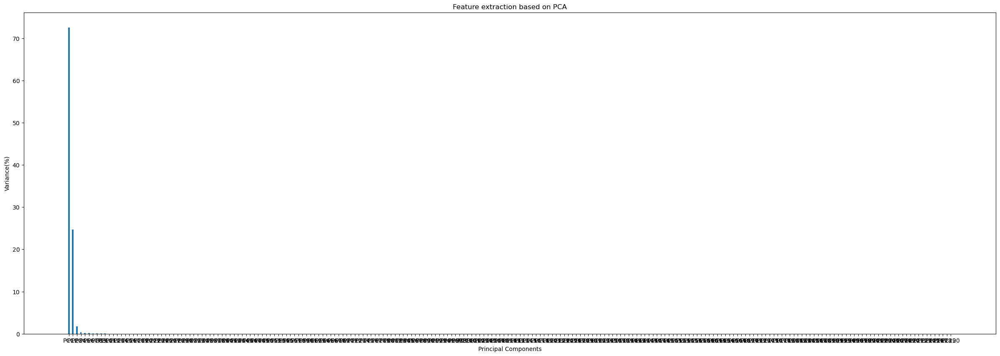

In [67]:
plt.figure(figsize=(30,10))
plt.bar(final_table.columns,final_table.loc['Variance(%)'],width = 0.4)
plt.xlabel('Principal Components')
plt.ylabel('Variance(%)')
plt.title('Feature extraction based on PCA')

Text(0.5, 1.0, 'Feature extraction based on PCA')

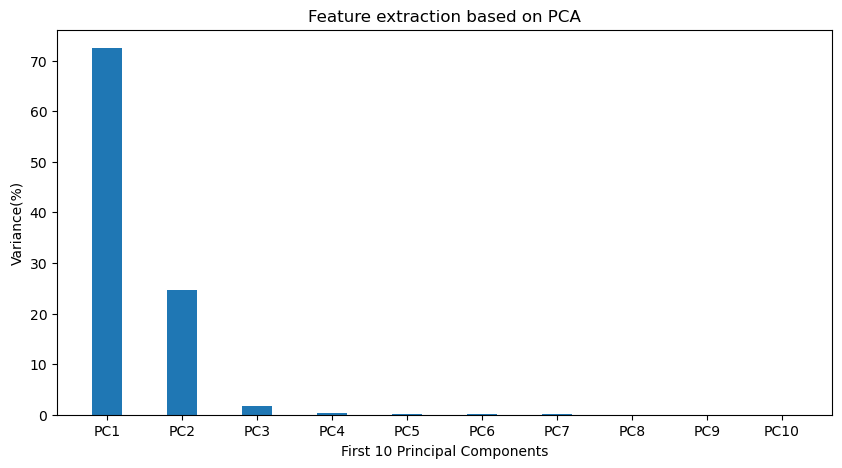

In [68]:
plt.figure(figsize=(10,5))
plt.bar(final_table.columns[:10],final_table.loc['Variance(%)'][:10],width = 0.4)
plt.xlabel('First 10 Principal Components')
plt.ylabel('Variance(%)')
plt.title('Feature extraction based on PCA')

Text(0.5, 1.0, 'Feature extraction based on PCA')

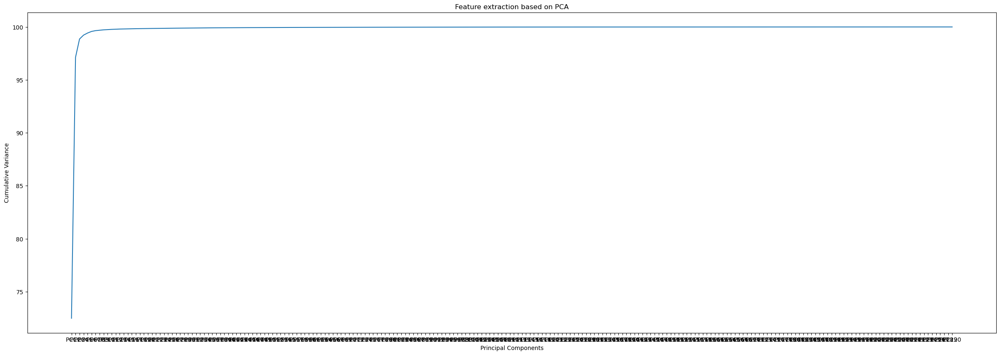

In [69]:
plt.figure(figsize=(30,10))
plt.plot(final_table.columns,final_table.loc['Cumulative Variance'])
plt.xlabel('Principal Components')
plt.ylabel('Cumulative Variance')
plt.title('Feature extraction based on PCA')

Text(0.5, 1.0, 'Feature extraction based on PCA')

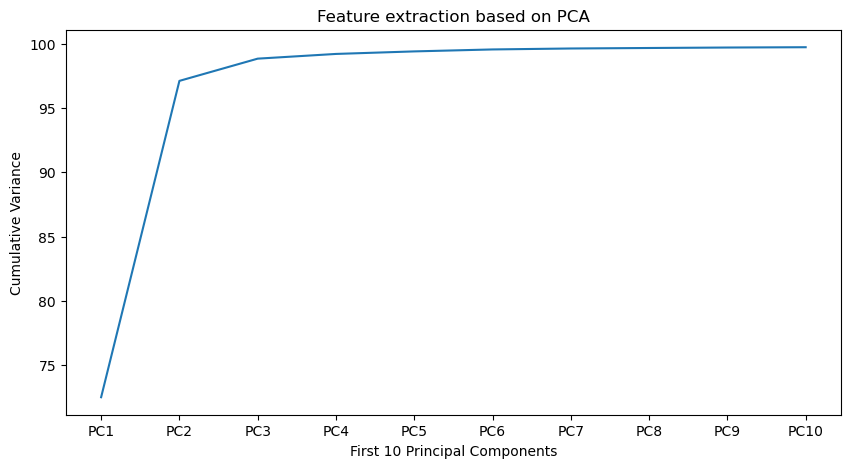

In [70]:
plt.figure(figsize=(10,5))
plt.plot(final_table.columns[:10],final_table.loc['Cumulative Variance'][:10])
plt.xlabel('First 10 Principal Components')
plt.ylabel('Cumulative Variance')
plt.title('Feature extraction based on PCA')

In [71]:
# selecting principal components that contain 95% varinace or information

l = list()

for i in final_table.columns:
    l.append(i)
    if final_table[i]['Cumulative Variance'] > 95 :
        break
print('The principal component(s) that cover more than 95% information are ',l)

The principal component(s) that cover more than 95% information are  ['PC1', 'PC2']


In [72]:
# extracted principal components

extracted_table = final_table[l]
extracted_table

,PC1,PC2
Variance,2.538311e+07,8.629688e+06
Variance(%),7.248499e+01,2.464327e+01
Cumulative Variance,7.248499e+01,9.712826e+01


In [73]:
# or we just can extract the number of principal components we want

l = list()
no_of_component = 2
count = 0

for i in final_table.columns:
    l.append(i)
    count = count + 1
    if count == no_of_component :
        break
print('The principal component(s) are ',l)

The principal component(s) are  ['PC1', 'PC2']


In [74]:
# extracted principal components

extracted_table = final_table[l]
extracted_table

,PC1,PC2
Variance,2.538311e+07,8.629688e+06
Variance(%),7.248499e+01,2.464327e+01
Cumulative Variance,7.248499e+01,9.712826e+01


Text(0, 0.5, 'PC2')

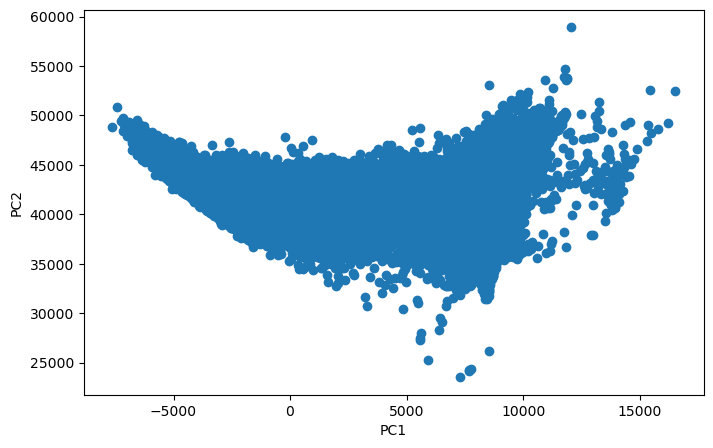

In [75]:
plt.figure(figsize=(8,5))
plt.scatter(transformed_table['PC1'],transformed_table['PC2'])
plt.xlabel('PC1')
plt.ylabel('PC2')

Text(0, 0.5, 'Second Principal Component')

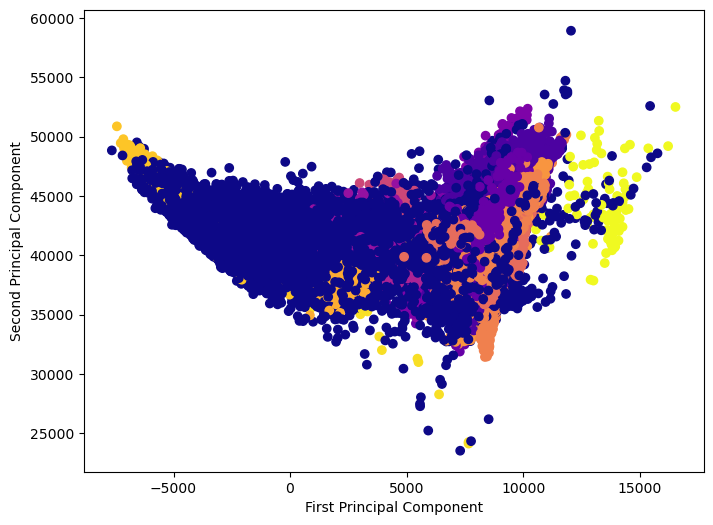

In [76]:
plt.figure(figsize=(8,6))
plt.scatter(transformed_table['PC1'],transformed_table['PC2'],c=target,cmap='plasma')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

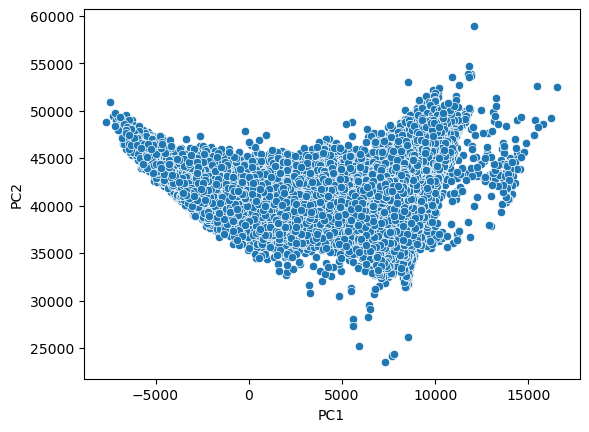

In [77]:
sns.scatterplot(x = transformed_table['PC1'],y = transformed_table['PC2'])

https://seaborn.pydata.org/generated/seaborn.scatterplot.html

In [78]:
transformed_table['PC1'].shape

(21025,)

In [79]:
target.shape

(21025,)

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

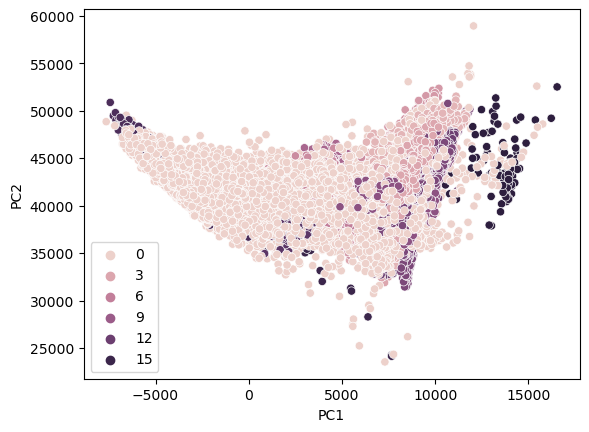

In [80]:
sns.scatterplot(x = transformed_table['PC1'], y = transformed_table['PC2'],hue=target)

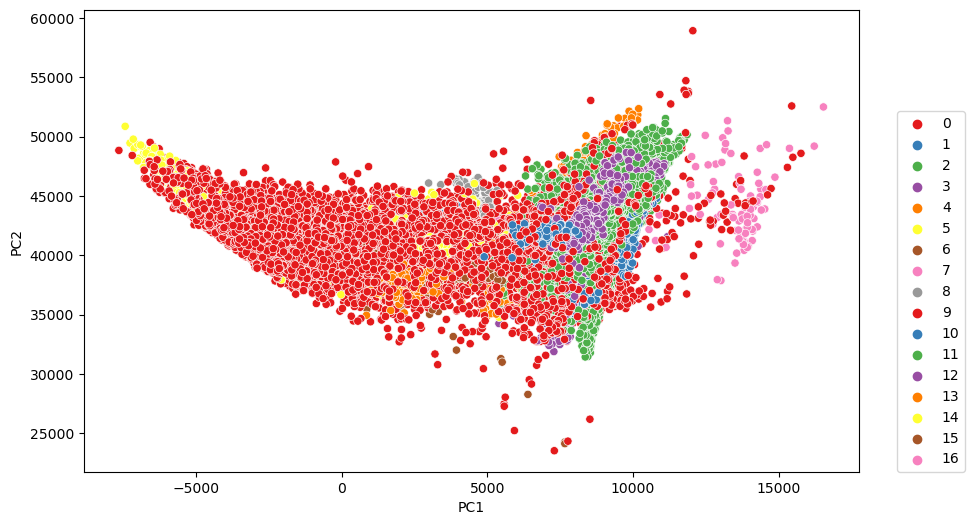

In [81]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=transformed_table['PC1'],y=transformed_table['PC2'],hue=target,palette='Set1')
plt.legend(loc=(1.05,0))

## 3 Dimensional Plot of PCA with 3 Principal Components

In [82]:
# or we just can extract the number of principal components we want

l = list()
no_of_component = 3
count = 0

for i in final_table.columns:
    l.append(i)
    count = count + 1
    if count == no_of_component :
        break
print('The principal component(s) are ',l)

The principal component(s) are  ['PC1', 'PC2', 'PC3']


In [83]:
# extracted principal components

extracted_table = final_table[l]
extracted_table

,PC1,PC2,PC3
Variance,2.538311e+07,8.629688e+06,606428.627930
Variance(%),7.248499e+01,2.464327e+01,1.731741
Cumulative Variance,7.248499e+01,9.712826e+01,98.859996


In [84]:
from mpl_toolkits import mplot3d

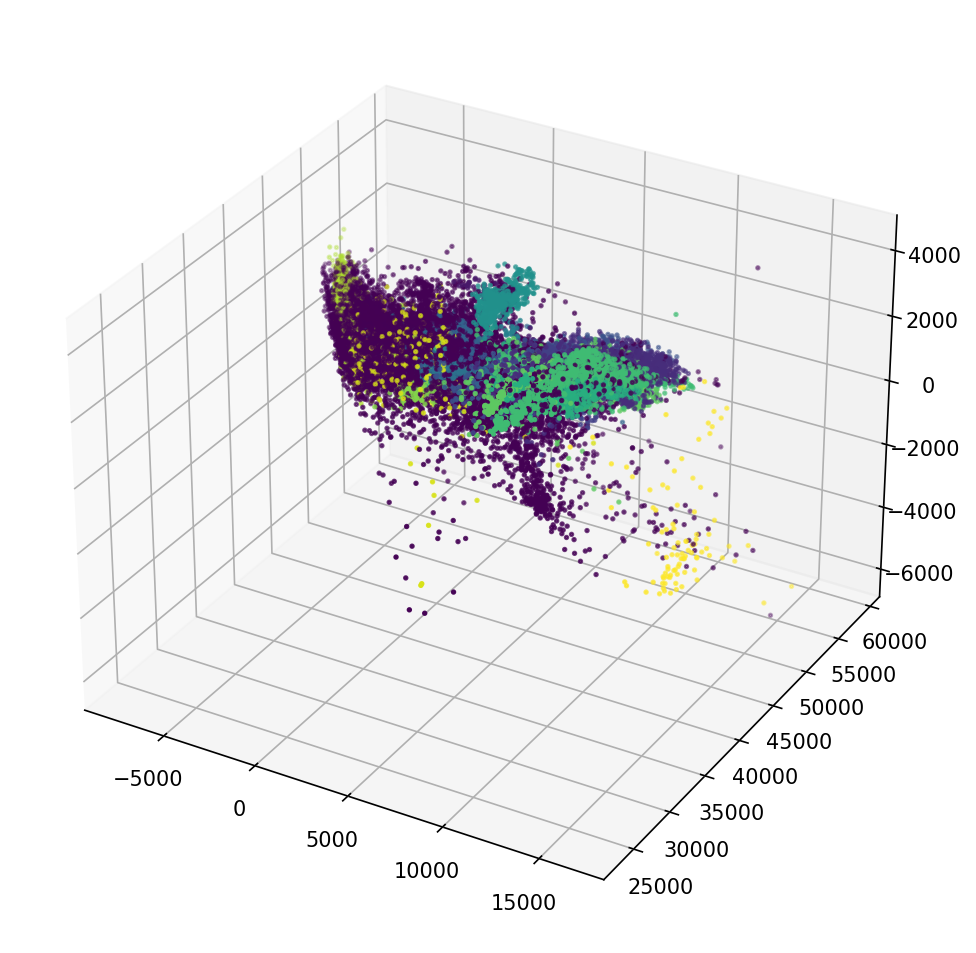

In [85]:
plt.figure(figsize=(8,8),dpi=150)
ax = plt.axes(projection='3d')
ax.scatter3D(transformed_table['PC1'],transformed_table['PC2'],transformed_table['PC3'],c=target,s=2.5);

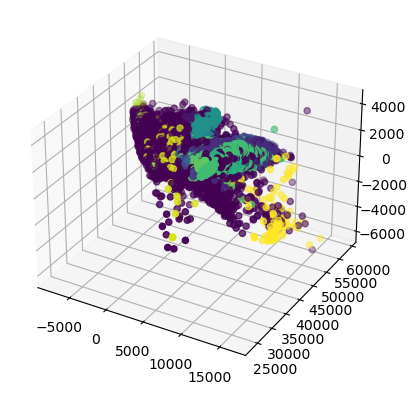

In [86]:
ax = plt.axes(projection='3d')
ax.scatter3D(transformed_table['PC1'],transformed_table['PC2'],transformed_table['PC3'],c=target)

## Image formation from first principal component

In [87]:
transformed_table['PC1']

0        8422.628259
1        8945.898229
2        9137.424518
3        8931.558065
4        8370.784646
            ...     
21020   -3947.685367
21021   -4138.885835
21022   -3725.634300
21023   -2786.761362
21024   -2962.802678
Name: PC1, Length: 21025, dtype: float64

In [88]:
transformed_table['PC1'].shape

(21025,)

In [89]:
np.array(transformed_table['PC1'])

array([ 8422.62825896,  8945.89822924,  9137.42451791, ...,
       -3725.63429983, -2786.76136236, -2962.8026784 ])

In [90]:
np.array(transformed_table['PC1']).reshape(145,145)

array([[ 8422.62825896,  8945.89822924,  9137.42451791, ...,
         7921.55589713,  7660.79996623,  7294.82247047],
       [ 8037.94311861,  8519.77465913,  8782.30915831, ...,
         9127.67543487,  8968.42058448,  8653.95242338],
       [ 8238.17080694,  8504.49915092,  8714.23393678, ...,
         8727.75844788,  8269.40604511,  7805.13657181],
       ...,
       [-3100.19568924, -3654.68273668, -4897.01836629, ...,
        -3566.07248731, -2417.26129465, -2872.84276183],
       [-3449.4296577 , -4045.01088614, -4852.94434341, ...,
        -2802.6579509 , -2699.35760193, -4185.5982796 ],
       [-3861.83645177, -5142.35406969, -5434.92413404, ...,
        -3725.63429983, -2786.76136236, -2962.8026784 ]])

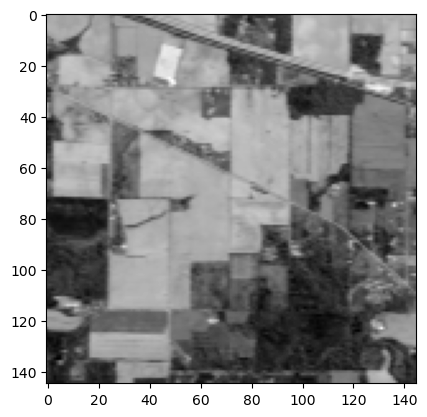

In [91]:
plt.imshow(np.array(transformed_table['PC1']).reshape(145,145),cmap='gray')
plt.show()

## Image formation from combination of 3 Principal Components

# KNN Implementation

## Making df

In [92]:
# or we just can extract the number of principal components we want

l = list()
no_of_component = 10
count = 0

for i in final_table.columns:
    l.append(i)
    count = count + 1
    if count == no_of_component :
        break
print('The principal component(s) are ',l)

The principal component(s) are  ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10']


In [93]:
# extracted principal components

extracted_table = final_table[l]
extracted_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
Variance,2.538311e+07,8.629688e+06,606428.627930,128537.965330,69275.826256,53271.494883,25984.192104,13617.979092,12670.981197,8336.142597
Variance(%),7.248499e+01,2.464327e+01,1.731741,0.367058,0.197827,0.152124,0.074201,0.038888,0.036184,0.023805
Cumulative Variance,7.248499e+01,9.712826e+01,98.859996,99.227054,99.424881,99.577005,99.651206,99.690094,99.726278,99.750083


In [94]:
extracted_table.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], dtype='object')

In [95]:
transformed_table[extracted_table.columns]

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,8422.628259,39915.847754,1956.475826,-2539.527041,-6122.120364,8060.110161,618.817889,-118.128361,-2871.988838,-1454.866803
1,8945.898229,43477.465541,1528.303074,-2585.875629,-5933.277401,7975.134389,484.012242,-173.401727,-2854.132292,-1370.145184
2,9137.424518,44556.091044,1465.982799,-2591.275184,-5995.765522,8020.858732,194.791794,-115.345197,-2815.196225,-1225.822287
3,8931.558065,43830.976844,1518.706476,-2590.419425,-5996.125993,8126.733029,369.147143,-112.982709,-2832.746490,-1385.384437
4,8370.784646,41130.657263,1976.052902,-2585.774934,-6151.510936,8206.616074,320.243006,29.754284,-2801.132391,-1583.559665
...,...,...,...,...,...,...,...,...,...,...
21020,-3947.685367,43126.379167,1737.655466,-2681.303255,-6486.419871,8311.477245,373.867476,-245.270050,-2709.631284,-1322.171851
21021,-4138.885835,43246.708074,1701.860789,-2600.905053,-6674.158100,8362.613345,246.441075,-306.725882,-2694.715886,-1221.998837
21022,-3725.634300,42516.170120,1711.060438,-2604.426969,-6477.717272,8364.526694,558.374523,-137.899066,-2601.078981,-1542.915917
21023,-2786.761362,40620.060564,1531.638827,-2594.900460,-6648.258516,8157.065995,495.714529,-374.254939,-2771.432382,-1390.825960


In [96]:
df = transformed_table[extracted_table.columns]
df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,8422.628259,39915.847754,1956.475826,-2539.527041,-6122.120364,8060.110161,618.817889,-118.128361,-2871.988838,-1454.866803
1,8945.898229,43477.465541,1528.303074,-2585.875629,-5933.277401,7975.134389,484.012242,-173.401727,-2854.132292,-1370.145184
2,9137.424518,44556.091044,1465.982799,-2591.275184,-5995.765522,8020.858732,194.791794,-115.345197,-2815.196225,-1225.822287
3,8931.558065,43830.976844,1518.706476,-2590.419425,-5996.125993,8126.733029,369.147143,-112.982709,-2832.746490,-1385.384437
4,8370.784646,41130.657263,1976.052902,-2585.774934,-6151.510936,8206.616074,320.243006,29.754284,-2801.132391,-1583.559665
...,...,...,...,...,...,...,...,...,...,...
21020,-3947.685367,43126.379167,1737.655466,-2681.303255,-6486.419871,8311.477245,373.867476,-245.270050,-2709.631284,-1322.171851
21021,-4138.885835,43246.708074,1701.860789,-2600.905053,-6674.158100,8362.613345,246.441075,-306.725882,-2694.715886,-1221.998837
21022,-3725.634300,42516.170120,1711.060438,-2604.426969,-6477.717272,8364.526694,558.374523,-137.899066,-2601.078981,-1542.915917
21023,-2786.761362,40620.060564,1531.638827,-2594.900460,-6648.258516,8157.065995,495.714529,-374.254939,-2771.432382,-1390.825960


In [97]:
target

array([3, 3, 3, ..., 0, 0, 0], dtype=int8)

In [98]:
df['target'] = target
df

C:\Users\HP\AppData\Local\Temp\ipykernel_11348\1132643761.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['target'] = target


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,target
0,8422.628259,39915.847754,1956.475826,-2539.527041,-6122.120364,8060.110161,618.817889,-118.128361,-2871.988838,-1454.866803,3
1,8945.898229,43477.465541,1528.303074,-2585.875629,-5933.277401,7975.134389,484.012242,-173.401727,-2854.132292,-1370.145184,3
2,9137.424518,44556.091044,1465.982799,-2591.275184,-5995.765522,8020.858732,194.791794,-115.345197,-2815.196225,-1225.822287,3
3,8931.558065,43830.976844,1518.706476,-2590.419425,-5996.125993,8126.733029,369.147143,-112.982709,-2832.746490,-1385.384437,3
4,8370.784646,41130.657263,1976.052902,-2585.774934,-6151.510936,8206.616074,320.243006,29.754284,-2801.132391,-1583.559665,3
...,...,...,...,...,...,...,...,...,...,...,...
21020,-3947.685367,43126.379167,1737.655466,-2681.303255,-6486.419871,8311.477245,373.867476,-245.270050,-2709.631284,-1322.171851,0
21021,-4138.885835,43246.708074,1701.860789,-2600.905053,-6674.158100,8362.613345,246.441075,-306.725882,-2694.715886,-1221.998837,0
21022,-3725.634300,42516.170120,1711.060438,-2604.426969,-6477.717272,8364.526694,558.374523,-137.899066,-2601.078981,-1542.915917,0
21023,-2786.761362,40620.060564,1531.638827,-2594.900460,-6648.258516,8157.065995,495.714529,-374.254939,-2771.432382,-1390.825960,0


In [99]:
n = len(df.columns)
n

11

## Train Test Split

In [100]:
from sklearn.model_selection import train_test_split

In [101]:
X = df.drop(df.columns[n-1],axis=1)
X

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,8422.628259,39915.847754,1956.475826,-2539.527041,-6122.120364,8060.110161,618.817889,-118.128361,-2871.988838,-1454.866803
1,8945.898229,43477.465541,1528.303074,-2585.875629,-5933.277401,7975.134389,484.012242,-173.401727,-2854.132292,-1370.145184
2,9137.424518,44556.091044,1465.982799,-2591.275184,-5995.765522,8020.858732,194.791794,-115.345197,-2815.196225,-1225.822287
3,8931.558065,43830.976844,1518.706476,-2590.419425,-5996.125993,8126.733029,369.147143,-112.982709,-2832.746490,-1385.384437
4,8370.784646,41130.657263,1976.052902,-2585.774934,-6151.510936,8206.616074,320.243006,29.754284,-2801.132391,-1583.559665
...,...,...,...,...,...,...,...,...,...,...
21020,-3947.685367,43126.379167,1737.655466,-2681.303255,-6486.419871,8311.477245,373.867476,-245.270050,-2709.631284,-1322.171851
21021,-4138.885835,43246.708074,1701.860789,-2600.905053,-6674.158100,8362.613345,246.441075,-306.725882,-2694.715886,-1221.998837
21022,-3725.634300,42516.170120,1711.060438,-2604.426969,-6477.717272,8364.526694,558.374523,-137.899066,-2601.078981,-1542.915917
21023,-2786.761362,40620.060564,1531.638827,-2594.900460,-6648.258516,8157.065995,495.714529,-374.254939,-2771.432382,-1390.825960


In [102]:
y = df[df.columns[n-1]]
y

0        3
1        3
2        3
3        3
4        3
        ..
21020    0
21021    0
21022    0
21023    0
21024    0
Name: target, Length: 21025, dtype: int8

In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)

In [104]:
X_train

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
11564,5221.975519,42392.193582,3046.203048,-3396.977117,-6075.693550,8061.047326,253.767709,-182.743976,-2721.522419,-1325.531569
6824,9103.765452,49470.511333,1784.988493,-2580.738781,-5912.499937,7978.444996,721.642106,-330.711508,-2844.463300,-1517.061349
13573,2953.703259,40962.521713,2778.622267,-2938.020711,-5841.865969,8038.180979,620.463093,-446.387889,-2787.155867,-1267.802539
6494,6712.136965,38437.407399,2989.415446,-2690.759621,-6161.565408,8528.038560,306.755741,-241.170705,-2853.460587,-1236.623233
15613,-5325.535617,45474.538275,1987.391891,-2566.732298,-6024.269787,8282.071723,439.825652,-286.704977,-2955.996467,-1375.672890
...,...,...,...,...,...,...,...,...,...,...
11284,-478.565976,40495.356058,2152.975418,-3053.353359,-6156.430615,7994.935667,253.418512,-230.949852,-2909.175766,-1308.609058
11964,8278.170724,45371.845543,2085.117315,-2756.419001,-6024.933038,8156.184416,560.026835,-63.931677,-2904.245302,-1261.748182
5390,8691.818783,44278.084628,1345.267514,-2942.227827,-6219.291244,7967.286734,784.069892,16.380731,-2963.999485,-1322.597889
860,9859.267314,44441.020440,2346.238621,-2864.593996,-6323.692280,8325.311412,298.252410,-81.848794,-2775.268103,-1548.953083


In [105]:
X_test

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
18460,9341.948623,44646.352818,1874.317195,-2385.247110,-5921.924511,8051.718886,502.593916,-269.595306,-2820.407960,-1368.044057
8260,3934.264230,43370.494615,3658.973869,-3755.570572,-6245.429293,7985.832815,241.680922,-181.041754,-2869.936232,-1321.360661
4741,-2758.100692,41091.094680,1626.132147,-2815.211665,-6611.085557,7984.989265,98.436685,-84.061411,-3058.425024,-1339.262414
10117,3365.825083,39451.050511,1867.657593,-3172.977708,-5984.445029,8201.401069,-13.736714,-352.017701,-2830.892352,-1377.238073
10596,-5070.973737,45056.244391,1509.577603,-2430.418998,-6535.749173,8115.836296,254.764442,-213.534549,-3090.319490,-1460.204822
...,...,...,...,...,...,...,...,...,...,...
5248,9986.813988,45441.927604,1950.056910,-2695.876641,-6289.523760,8101.211170,287.321474,-134.393003,-2853.781329,-1192.992392
4455,-2985.851973,41261.100796,1759.407390,-2628.012382,-6452.478423,8088.362641,630.357653,-307.553387,-2749.562891,-1392.005946
9418,1846.023126,42855.762437,2814.568962,-3708.671257,-5922.415917,7814.046872,76.662884,-224.726212,-2794.200052,-1503.041419
9185,10020.217062,45002.656410,2198.402521,-2532.579966,-6089.124276,7923.396514,495.599732,-11.972022,-2790.258814,-1373.791840


## Finding the Best Value of K

In [106]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [107]:
import math
k = math.floor(math.sqrt(len(y_train)))

if k%2==0 :
    k = k + 1

print(k)

121


In [108]:
k_value = k

In [109]:
k_list = list()
accuracy_list = list()

for k in range(k_value):
    k = k + 1
    k_list.append(k)

    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)

    y_pred = knn.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred) * 100
    accuracy_list.append(accuracy)

Text(0, 0.5, 'Accuracy')

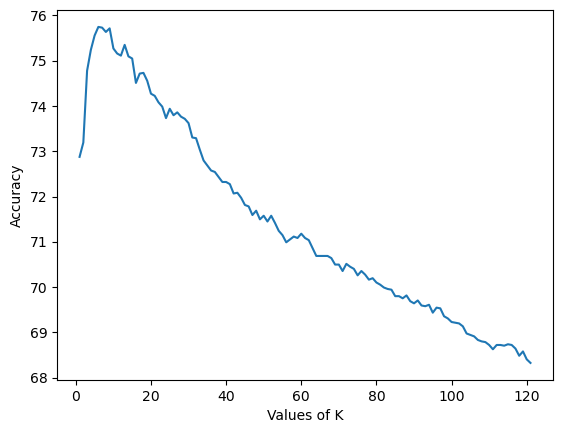

In [110]:
plt.plot(k_list,accuracy_list)
plt.xlabel('Values of K')
plt.ylabel('Accuracy')

In [111]:
max_accuracy = 0

for k in range(k_value):
    if accuracy_list[k] > max_accuracy:
        max_accuracy = accuracy_list[k]
        k_best = k_list[k]

print('Maximum Accuracy :',max_accuracy)
print('Best value of K :',k_best)

Maximum Accuracy : 75.74508560558021
Best value of K : 6


In [112]:
max_accuracy = max(accuracy_list)
print(max_accuracy)
max_index = accuracy_list.index(max(accuracy_list))
print(max_index)

k_best = k_list[max_index]
print(k_best)

75.74508560558021
5
6
